In [1]:
# !/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on 20191125

@author: zhangji

test the linear relationship
U_t =?= U_sh + U_wm
U_t is the total velocity
U_sh is the velocity induced by shear flow
U_wm is the active velocity. 
"""

# %pylab inline
# pylab.rcParams['figure.figsize'] = (25, 11)
# fontsize = 40

# import numpy as np
# import scipy as sp
# from scipy.optimize import leastsq, curve_fit
# from scipy import interpolate
# from scipy.interpolate import interp1d
# from scipy.io import loadmat, savemat
# # import scipy.misc

# import matplotlib
# from matplotlib import pyplot as plt
# from matplotlib import animation, rc
# import matplotlib.ticker as mtick
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
# from mpl_toolkits.mplot3d import Axes3D, axes3d

# from sympy import symbols, simplify, series, exp
# from sympy.matrices import Matrix
# from sympy.solvers import solve

# from IPython.display import display, HTML
# from tqdm import tqdm_notebook as tqdm
# import pandas as pd
# import re
# from scanf import scanf
# import os
# import glob

# from codeStore import support_fun as spf
# from src.support_class import *
# from src import stokes_flow as sf

# rc('animation', html='html5')
# PWD = os.getcwd()
# font = {'size': 20}
# matplotlib.rc('font', **font)
# np.set_printoptions(linewidth=90, precision=5)

import os
import glob
import re
import pandas as pd
from scanf import scanf
import natsort 
import numpy as np
import scipy as sp
from scipy.optimize import leastsq, curve_fit
from scipy import interpolate
from scipy import spatial
# from scipy.interpolate import interp1d
from scipy.io import loadmat, savemat
# import scipy.misc
import importlib
from IPython.display import display, HTML
import pickle

import matplotlib
from matplotlib import pyplot as plt
from matplotlib import colors as mcolors
from matplotlib import animation, rc
import matplotlib.ticker as mtick
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
from mpl_toolkits.mplot3d import Axes3D, axes3d
from matplotlib import ticker, cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

from time import time
from src import support_class as spc
from src import jeffery_model as jm
from codeStore import support_fun as spf

# %matplotlib notebook

%matplotlib inline
rc('animation', html='html5')
rc('text', usetex=True)
params = {'text.latex.preamble': [r'\usepackage{bm}', r'\usepackage{amsmath}']}
plt.rcParams.update(params)
fontsize = 40
figsize = (30, 16)
PWD = os.getcwd()

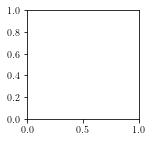

In [2]:
fig = plt.figure(figsize=(2, 2))
fig.patch.set_facecolor('white')
ax0 = fig.add_subplot(1, 1, 1)

In [2]:
# load data
psv_pickle = 'ecoC01B05_tau1c_passive'
atv_pickle = 'ecoC01B05_T100'
importlib.reload(spf)
importlib.reload(spc)

with open('%s.pickle' % psv_pickle, 'rb') as handle:
    psv_data = pickle.load(handle)
with open('%s.pickle' % atv_pickle, 'rb') as handle:
    atv_data = pickle.load(handle)

gap_data = []
for tpsv, tatv in zip(psv_data, atv_data):
    t0 = []
    err_msg = 'psi is not identical.'
    assert tpsv[0] == tatv[0], err_msg
    tpsi = tpsv[0]
    t0.append(tpsv[0])
    t1 = []
    for (typ, txp, tUp), (tya, txa, tUa) in zip(tpsv[1], tatv[1]):
        err_msg = 'theta is not identical.'
        assert np.all(typ == tya), err_msg
        err_msg = 'phi is not identical.'
        assert np.all(txp == txa), err_msg
        t1.append((typ, txp, tUa - tUp))
    t0.append(t1)
    gap_data.append(t0)


for tpsi, table_psi_data in gap_data:
    # rotate the U vector back 
    tux = []
    tuy = []
    tuz = []
    for ttheta, t10, t11, t12 in zip(table_psi_data[0][0], 
                                     table_psi_data[0][2].values, 
                                     table_psi_data[1][2].values, 
                                     table_psi_data[2][2].values):
        for tphi, ttux, ttuy, ttuz in zip(table_psi_data[0][1], t10, t11, t12):
            t2 = np.array((ttux, ttuy, ttuz))
#             t2 = vector_rotation(t2, norm=np.array((0, 1, 0)), theta=ttheta)
#             t2 = vector_rotation(t2, norm=np.array((0, 0, 1)), theta=tphi)
            t2 = spc.vector_rotation(t2, norm=np.array((0, 0, 1)), theta=-tphi)
            t2 = spc.vector_rotation(t2, norm=np.array((0, 1, 0)), theta=-ttheta)
            t2 = spc.vector_rotation(t2, norm=np.array((0, 0, 1)), theta=-tpsi)
            tux.append(t2[0].copy())
            tuy.append(t2[1].copy())
            tuz.append(t2[2].copy())
#     tux = np.array((tux)).reshape(table_psi_data[0][2].values.shape)
#     tuy = np.array((tuy)).reshape(table_psi_data[0][2].values.shape)
#     tuz = np.array((tuz)).reshape(table_psi_data[0][2].values.shape)
    # rotate the W vector back 
    twx = []
    twy = []
    twz = []
    for ttheta, t10, t11, t12 in zip(table_psi_data[0][0], 
                                     table_psi_data[3][2].values, 
                                     table_psi_data[4][2].values, 
                                     table_psi_data[5][2].values):
        for tphi, ttwx, ttwy, ttwz in zip(table_psi_data[0][1], t10, t11, t12):
            t2 = np.array((ttwx, ttwy, ttwz))
#             t2 = vector_rotation(t2, norm=np.array((0, 1, 0)), theta=ttheta)
#             t2 = vector_rotation(t2, norm=np.array((0, 0, 1)), theta=tphi)
            t2 = spc.vector_rotation(t2, norm=np.array((0, 0, 1)), theta=-tphi)
            t2 = spc.vector_rotation(t2, norm=np.array((0, 1, 0)), theta=-ttheta)
            t2 = spc.vector_rotation(t2, norm=np.array((0, 0, 1)), theta=-tpsi)
            twx.append(t2[0].copy())
            twy.append(t2[1].copy())
            twz.append(t2[2].copy())
#     twx = np.array((twx)).reshape(table_psi_data[0][2].values.shape)
#     twy = np.array((twy)).reshape(table_psi_data[0][2].values.shape)
#     twz = np.array((twz)).reshape(table_psi_data[0][2].values.shape)


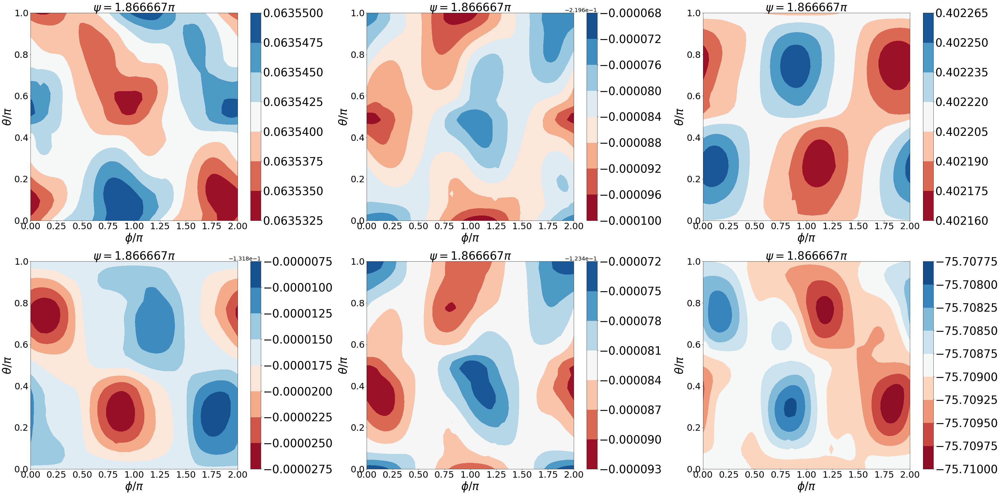

In [3]:
fig = plt.figure(figsize=(50, 25))
fig.patch.set_facecolor('white')
axs = fig.subplots(nrows=2, ncols=3)
for tui, taxi in zip((tux, tuy, tuz, twx, twy, twz), axs.flatten()):        
    plt.sca(taxi)
    im = taxi.contourf(table_psi_data[0][1] / np.pi, 
                       table_psi_data[0][0] / np.pi, 
                       np.array((tui)).reshape(table_psi_data[0][2].values.shape), 
                       cmap=plt.get_cmap('RdBu'))
    taxi.set_title('$\\psi=%f \pi$' % (tpsi / np.pi), fontsize=fontsize)
    taxi.set_xlabel('$\\phi / \pi$', fontsize=fontsize)
    taxi.set_ylabel('$\\theta / \pi$', fontsize=fontsize)
    fig.colorbar(im, ax=taxi, orientation='vertical').ax.tick_params(labelsize=fontsize)
    plt.xticks(fontsize=fontsize*0.8)
    plt.yticks(fontsize=fontsize*0.8)
    plt.tight_layout()


In [122]:
spc.vector_rotation(np.array((4,5,3)), norm=np.array((2,7,1)), theta=np.pi*0.43232)

array([ 4.31657,  5.49372, -1.08917])

In [4]:
# make lookup table of active ecoli in free space
importlib.reload(spf)
importlib.reload(spc)

psv_pickle = 'ecoC01B05_tau1c_passive'  # template
atv_free_pickle = 'ecoC01B05_active' # create a new pickle to save the results
U_wm_free = np.array((6.35412896e-04, -2.19685002e-03, 4.02207153e-03, -1.31816782e-03, -1.23482706e-03, -7.57091305e-01)) # w_m=1

# ((psi, ((theta, phi, ui))))
with open('%s.pickle' % psv_pickle, 'rb') as handle:
    psv_data = pickle.load(handle)

atv_free_data = []
for tpsi, table_psi_data in psv_data:
    # rotate U vector to the corrdinate in the derection (theta, phi, psi)
    tux = []
    tuy = []
    tuz = []
    for ttheta in table_psi_data[0][0]:
        for tphi in table_psi_data[0][1]:
            t2 = U_wm_free[:3].copy()
            t2 = spc.vector_rotation(t2, norm=np.array((0, 0, 1)), theta=tpsi)
            t2 = spc.vector_rotation(t2, norm=np.array((0, 1, 0)), theta=ttheta)
            t2 = spc.vector_rotation(t2, norm=np.array((0, 0, 1)), theta=tphi)
            tux.append(t2[0].copy())
            tuy.append(t2[1].copy())
            tuz.append(t2[2].copy())
            
    # rotate W vector to the corrdinate in the derection (theta, phi, psi)
    twx = []
    twy = []
    twz = []
    for ttheta in table_psi_data[0][0]:
        for tphi in table_psi_data[0][1]:
            t2 = U_wm_free[3:].copy()
            t2 = spc.vector_rotation(t2, norm=np.array((0, 0, 1)), theta=tpsi)
            t2 = spc.vector_rotation(t2, norm=np.array((0, 1, 0)), theta=ttheta)
            t2 = spc.vector_rotation(t2, norm=np.array((0, 0, 1)), theta=tphi)
            twx.append(t2[0].copy())
            twy.append(t2[1].copy())
            twz.append(t2[2].copy())
    
    # construct new lookup table
    t0 = []
    t0.append(tpsi)
    t1 = []
    for tui in (tux, tuy, tuz, twx, twy, twz):
        t2 = table_psi_data[0][2].copy()
        t2.iloc[:, :] = np.array((tui)).reshape(table_psi_data[0][2].values.shape)
        t1.append((table_psi_data[0][0], table_psi_data[0][1], t2))
    t0.append(t1)
    atv_free_data.append(t0)


with open('%s.pickle' % atv_free_pickle, 'wb') as handle:
    pickle.dump(atv_free_data, handle, protocol=pickle.HIGHEST_PROTOCOL)
print('save table_data to %s.pickle' % atv_free_pickle)

save table_data to ecoC01B05_active.pickle


In [5]:
# create new table 
psv_pickle = 'ecoC01B05_tau1c_passive'
atv_free_pickle = 'ecoC01B05_active'
tao_s = 1
w_m = 1
atv_shear_pickle = 'ecoC01B05_tao1_wm1' # create a new pickle to save the results

# ((psi, ((theta, phi, ui))))
with open('%s.pickle' % psv_pickle, 'rb') as handle:
    psv_data = pickle.load(handle)
with open('%s.pickle' % atv_free_pickle, 'rb') as handle:
    atv_free_data = pickle.load(handle)
    
atv_shear_data = []
for tpsv, tatv in zip(psv_data, atv_free_data):
    t0 = []
    err_msg = 'psi is not identical.'
    assert tpsv[0] == tatv[0], err_msg
    tpsi = tpsv[0]
    t0.append(tpsi)
    t1 = []
    for (typ, txp, tUp), (tya, txa, tUa) in zip(tpsv[1], tatv[1]):
        err_msg = 'theta is not identical.'
        assert np.all(typ == tya), err_msg
        err_msg = 'phi is not identical.'
        assert np.all(txp == txa), err_msg
        t1.append((typ, txp, tUa * w_m + tUp * tao_s))
    t0.append(t1)
    atv_shear_data.append(t0)

with open('%s.pickle' % atv_shear_pickle, 'wb') as handle:
    pickle.dump(atv_shear_data, handle, protocol=pickle.HIGHEST_PROTOCOL)
print('save table_data to %s.pickle' % atv_shear_pickle)

save table_data to ecoC01B05_tao1_wm1.pickle


ecoC01B05_tao1_wm0


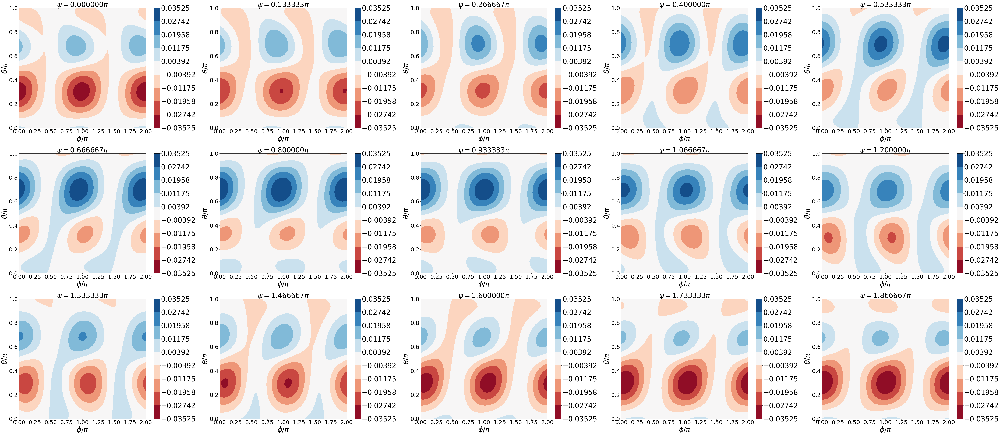

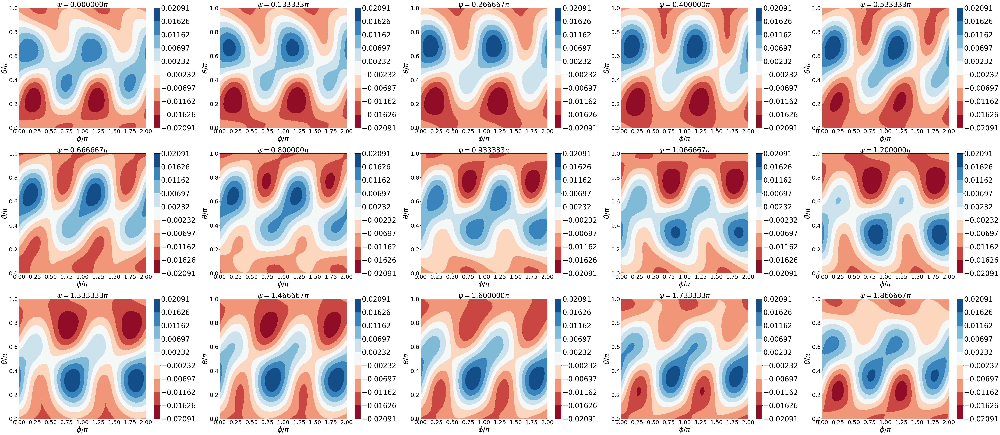

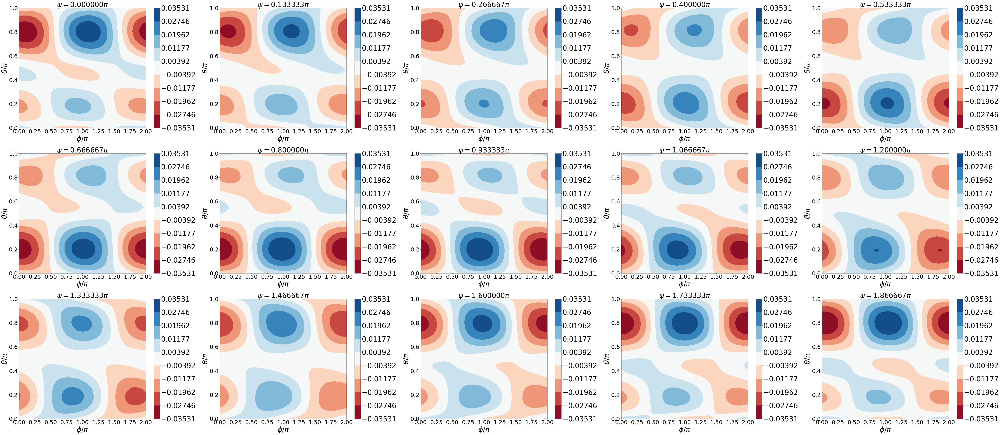

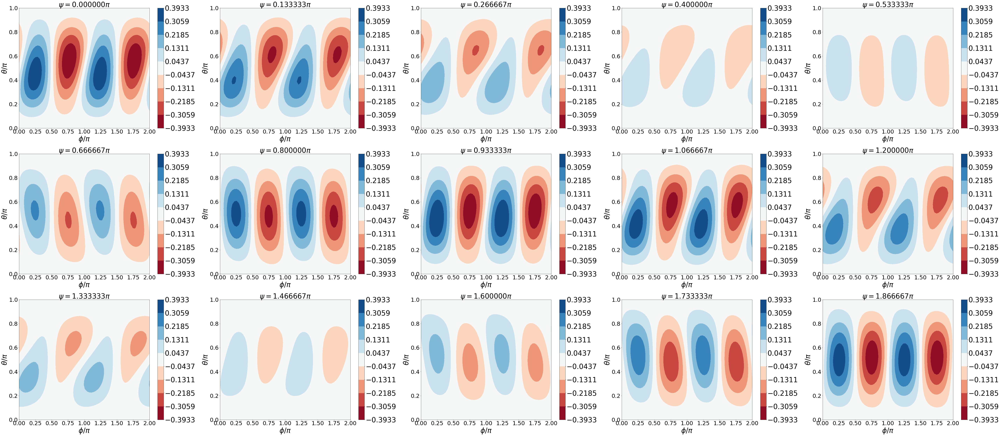

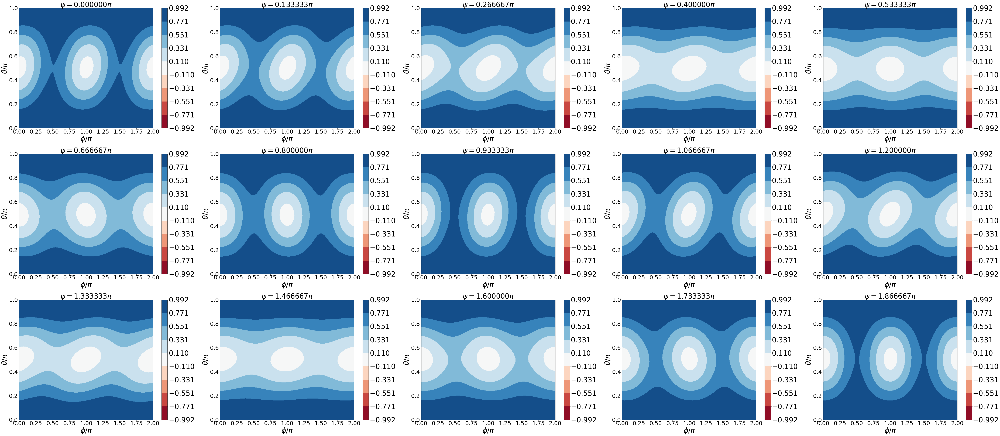

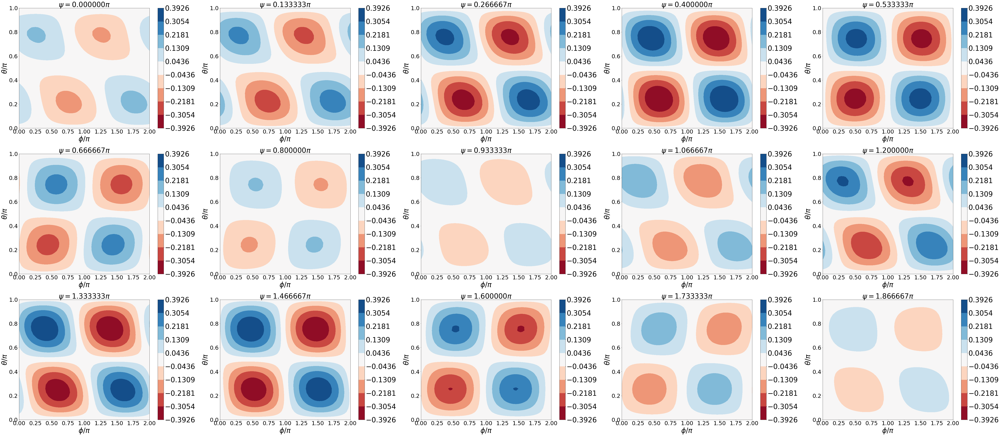

In [6]:
# and show phase map of (ui, wi) as function of (theta, phi, psi)
atv_shear_pickle = 'ecoC01B05_tao1_wm0'

# ((psi, ((theta, phi, ui))))
print(atv_shear_pickle)
with open('%s.pickle' % atv_shear_pickle, 'rb') as handle:
    atv_shear_data = pickle.load(handle)
    
U_all = [[] for i in range(6)]
for tpsi, table_psi_data in atv_shear_data:
    for (ty, tx, tU), Ui in zip(table_psi_data, U_all):
        Ui.append((tpsi, ty, tx, tU))
        
for Ui in U_all:
    t1 = []
    for _, _, _, tU in Ui:
        t1.append(np.nanmax(np.abs(tU.values)))
    t1 = np.nanmax(t1) 
    fig = plt.figure(figsize=(80, 35))
    fig.patch.set_facecolor('white')
    axs = fig.subplots(nrows=3, ncols=5)
    for (tpsi, ty, tx, use_U), ax0 in zip(Ui, axs.flatten()):
        levels = np.linspace(-t1, t1, 10)
        im = ax0.contourf(tx / np.pi, ty / np.pi, use_U.values, 
                          levels, cmap=plt.get_cmap('RdBu'))
        ax0.set_title('$\\psi=%f \pi$' % (tpsi / np.pi), fontsize=fontsize)
        ax0.set_xlabel('$\\phi / \pi$', fontsize=fontsize)
        ax0.set_ylabel('$\\theta / \pi$', fontsize=fontsize)
        fig.colorbar(im, ax=ax0, orientation='vertical').ax.tick_params(labelsize=fontsize)
        plt.sca(ax0)
        plt.xticks(fontsize=fontsize*0.8)
        plt.yticks(fontsize=fontsize*0.8)
    plt.tight_layout()

ecoC01B05_tao1_wm0 polar


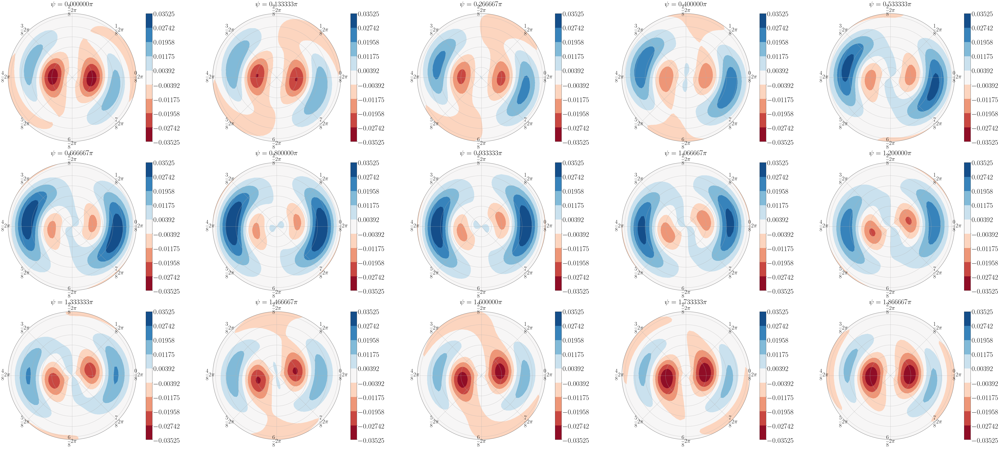

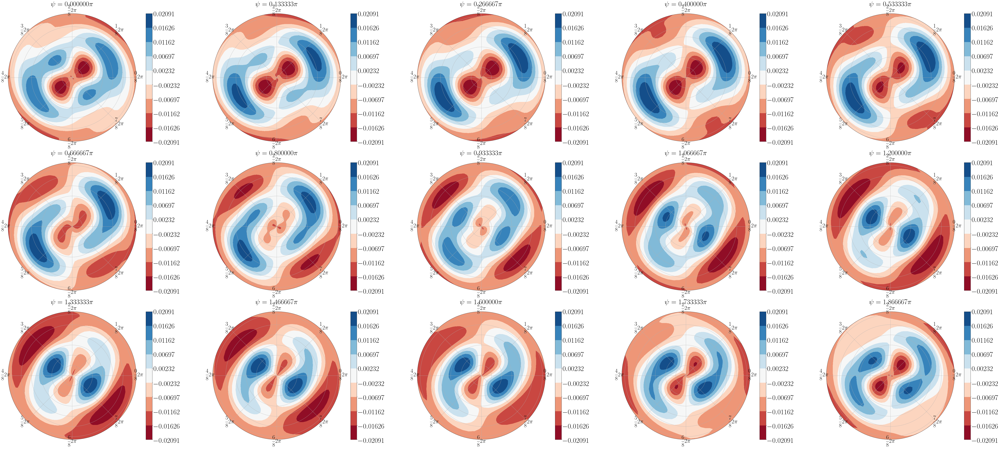

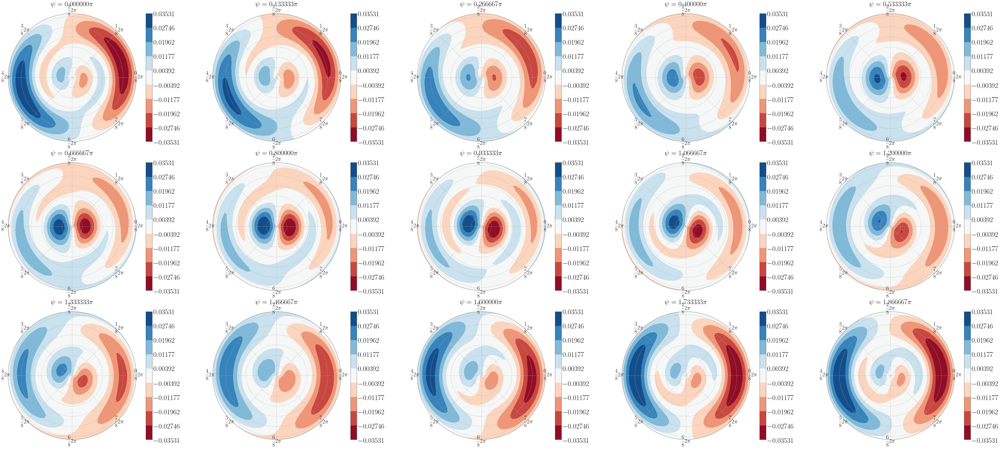

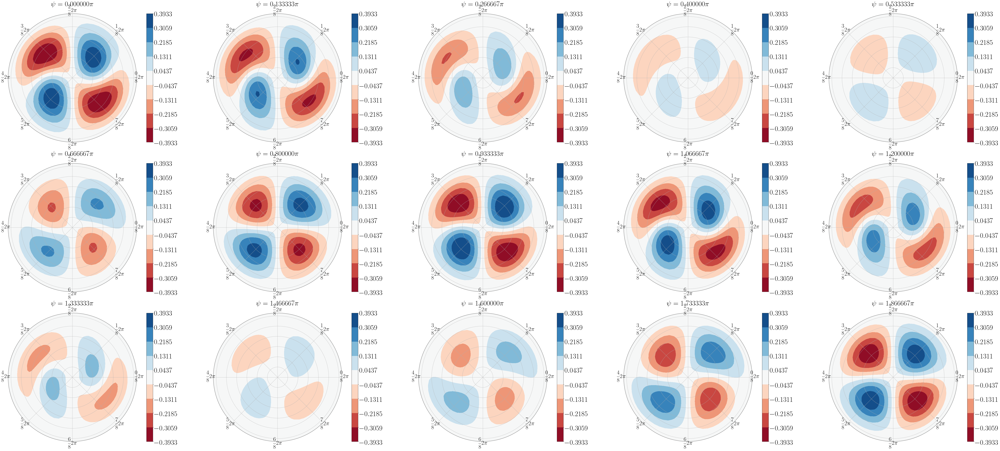

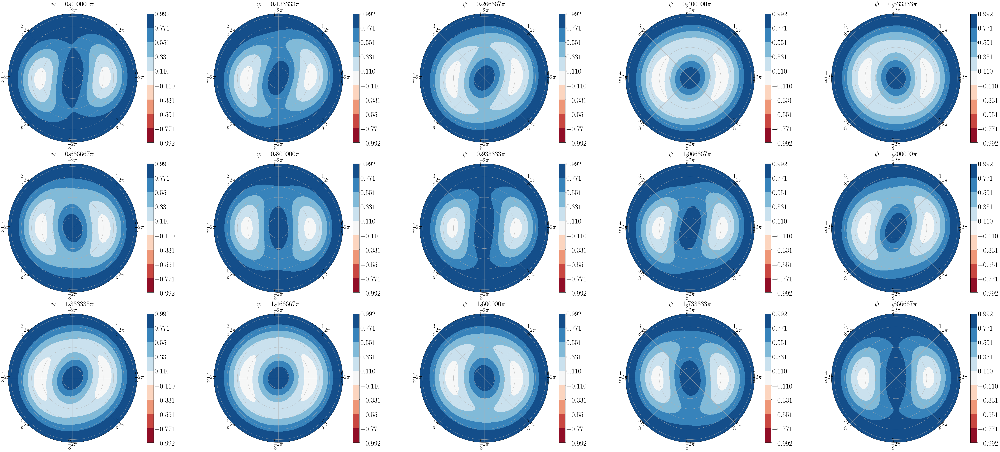

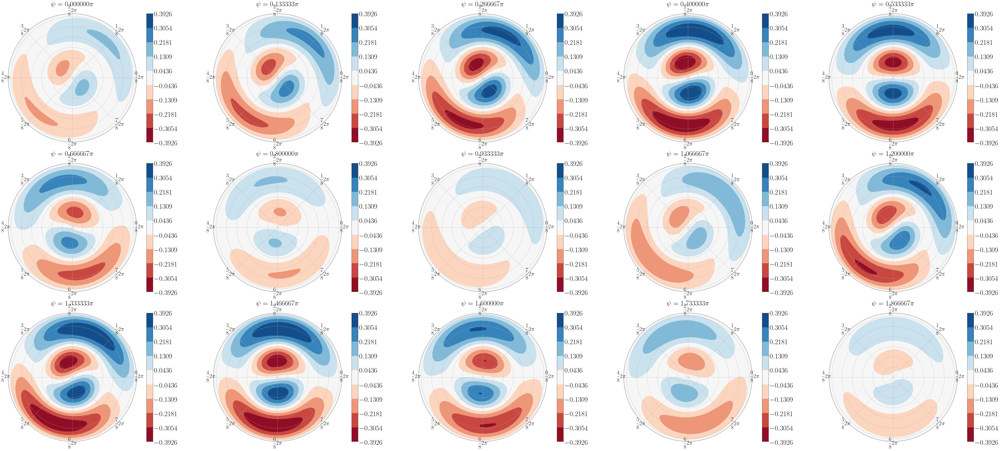

In [294]:
# show phase map of (ui, wi) as function of (theta, phi, psi) in polar coordinate. 
atv_shear_pickle = 'ecoC01B05_tao1_wm0'

# ((psi, ((theta, phi, ui))))
print(atv_shear_pickle, 'polar')
with open('%s.pickle' % atv_shear_pickle, 'rb') as handle:
    atv_shear_data = pickle.load(handle)
    
U_all = [[] for i in range(6)]
for tpsi, table_psi_data in atv_shear_data:
    for (ty, tx, tU), Ui in zip(table_psi_data, U_all):
        Ui.append((tpsi, ty, tx, tU))

for Ui in U_all[:]:
    t1 = []
    for _, _, _, tU in Ui:
        t1.append(np.nanmax(np.abs(tU.values)))
    t1 = np.nanmax(t1) 
    fig = plt.figure(figsize=(80, 35))
    fig.patch.set_facecolor('white')
    axs = fig.subplots(nrows=3, ncols=5, subplot_kw=dict(polar=True))
    for (tpsi, ty, tx, use_U), ax0 in zip(Ui[:], axs.flatten()):
        levels = np.linspace(-t1, t1, 10)
        im = ax0.contourf(tx, ty, use_U.values, 
                          levels, cmap=plt.get_cmap('RdBu'))
        fig.colorbar(im, ax=ax0, orientation='vertical').ax.tick_params(labelsize=fontsize)
        ax0.set_title('$\\psi=%f \pi$' % (tpsi / np.pi), fontsize=fontsize)
        n_xticks = 8
        xticks = np.arange(n_xticks)
        ax0.set_xticks(xticks / n_xticks * 2 * np.pi)
        ax0.set_xticklabels(['$\dfrac{%d}{%d}2\pi$' % (i0, n_xticks) for i0 in xticks])
        ax0.set_yticklabels([])
        ax0.set_ylim(0, np.pi)
        plt.sca(ax0)
        plt.xticks(fontsize=fontsize*0.8)
        plt.yticks(fontsize=fontsize*0.8)
    plt.tight_layout()

In [292]:
tfun = interpolate.RectBivariateSpline(ty, tx, tU.values, kx=3, ky=3)
ntpx, ntpy = 64, 64
tpx, tpy = np.meshgrid(np.linspace(0, 1, ntpx), np.linspace(0, 1, ntpy))
tpz = np.sqrt(np.abs(1 - tpx ** 2 - tpy ** 2))
tth = np.arccos(tpz)
tph = np.arctan2(tpy, tpx)
tU_use = []
for t1, t2 in zip(tth.ravel(), tph.ravel()):
    tU_use.append(tfun(t1, t2))
tU_use = np.hstack(tU_use).reshape(tph.shape)

In [297]:
# # Archive!!!!!!!!!
# # show phase map of (ui, wi) as function of (Px, Py, psi), here P=(Px, Py, Pz) is the norm of object. 
# atv_shear_pickle = 'ecoC01B05_tao1_wm0'
# ntpx, ntpy = 64, 64

# # ((psi, ((theta, phi, ui))))
# print(atv_shear_pickle)
# with open('%s.pickle' % atv_shear_pickle, 'rb') as handle:
#     atv_shear_data = pickle.load(handle)
    
# U_all = [[] for i in range(6)]
# for tpsi, table_psi_data in atv_shear_data:
#     for (ty, tx, tU), Ui in zip(table_psi_data, U_all):
#         Ui.append((tpsi, ty, tx, tU))
        
# for Ui in U_all[:1]:
#     t1 = []
#     for _, _, _, tU in Ui:
#         t1.append(np.nanmax(np.abs(tU.values)))
#     t1 = np.nanmax(t1) 
#     fig = plt.figure(figsize=(80, 35))
#     fig.patch.set_facecolor('white')
#     axs = fig.subplots(nrows=3, ncols=5)
#     levels = np.linspace(-t1, t1, 10)
#     for (tpsi, ty, tx, tU), ax0 in zip(Ui, axs.flatten()[:1]):
#         # do interpolate
#         tfun = interpolate.RectBivariateSpline(ty, tx, tU.values, kx=3, ky=3)
#         ntpx, ntpy = 64, 64
#         tpx, tpy = np.meshgrid(np.linspace(0, 1, ntpx), np.linspace(0, 1, ntpy))
#         tpz = np.sqrt(np.abs(1 - tpx ** 2 - tpy ** 2))
#         tth = np.arccos(tpz)
#         tph = np.arctan2(tpy, tpx)
#         tU_use = []
#         for t1, t2 in zip(tth.ravel(), tph.ravel()):
#             tU_use.append(tfun(t1, t2))
#         tU_use = np.hstack(tU_use).reshape(tph.shape)
        
# #         tfun = interpolate.RectBivariateSpline(ty, tx, tU.values, kx=3, ky=3)
# #         tpx, tpy = np.meshgrid(np.linspace(0, 1, ntpx), np.linspace(0, 1, ntpy))
# #         tpz = np.sqrt(np.abs(1 - tpx ** 2 - tpy ** 2))
# #         tU_use = np.array([tfun(tth, tph) for tth, tph in zip(np.arccos(tpz).ravel(), np.arctan2(tpy, tpx).ravel())]
# #                          ).reshape(tpz.shape)
        
#         plt.sca(ax0)   
#         im = ax0.contourf(tpx, tpy, tU_use, levels, cmap=plt.get_cmap('RdBu'))
#         ax0.set_title('$\\psi=%f \pi$' % (tpsi / np.pi), fontsize=fontsize)
#         ax0.set_xlabel('$\\bm{P}_x$', fontsize=fontsize)
#         ax0.set_ylabel('$\\bm{P}_y$', fontsize=fontsize)
#         fig.colorbar(im, ax=ax0, orientation='vertical').ax.tick_params(labelsize=fontsize)
#         plt.xticks(fontsize=fontsize*0.8)
#         plt.yticks(fontsize=fontsize*0.8)
#     plt.tight_layout()

In [126]:
# export to VTK file
vtk_pickle = 'ecoC01B05_tao1_wm1'
wm = 1

# ((psi, ((theta, phi, ui))))
with open('%s.pickle' % vtk_pickle, 'rb') as handle:
    pickle_data = pickle.load(handle)
        
ttheta, tphi = pickle_data[0][1][0][:2]
tpsi = np.array([ti[0] for ti in pickle_data])
vtk_theta, vtk_phi, vtk_psi = np.meshgrid(ttheta, tphi, tpsi, indexing='ij')

dtheta_all = []
dphi_all = []
dpsi_all = []
ttheta_all = []
tphi_all= []
tpsi_all = []
for tpsi, table_psi_data in pickle_data:
    ttheta, tphi = np.meshgrid(*table_psi_data[0][:2], indexing='ij')
    tPx = np.sin(ttheta) * np.cos(tphi)
    tPy = np.sin(ttheta) * np.sin(tphi)
    tPz = np.cos(ttheta)
    twx = table_psi_data[3][2].values.copy()
    twy = table_psi_data[4][2].values.copy()
    twz = table_psi_data[5][2].values.copy()
    ttheta_all.append(twx)
    tphi_all.append(twy)
    tpsi_all.append(twz)
    dtheta_all.append(twy * np.cos(tphi) - twx * np.sin(tphi))
    t1 = twz - (twx * np.cos(tphi) + twy * np.sin(tphi)) / np.tan(ttheta)
    t1[np.isinf(t1)] = np.nan
    dphi_all.append(t1)
    dpsi_all.append(wm * np.ones_like(ttheta))
ttheta_all = np.dstack(ttheta_all)
tphi_all = np.dstack(tphi_all)
tpsi_all = np.dstack(tpsi_all)
dtheta_all = np.dstack(dtheta_all)
dphi_all = np.dstack(dphi_all)
dpsi_all = np.dstack(dpsi_all)

vtk_name = os.path.join(PWD, 'theta_phi_psi_VTK', vtk_pickle)
gridToVTK(vtk_name, vtk_theta, vtk_phi, vtk_psi, 
          pointData = {'th_ph_psi': (ttheta_all, tphi_all, tpsi_all), 
                       'dth_dph_dps' : (dtheta_all, dphi_all, dpsi_all)})

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


'/home/zhangji/stokes_flow_master/head_Force/loop_table/theta_phi_psi_VTK/ecoC01B05_tao1_wm1.vts'

In [489]:
# do FFT of velocity component and pick major frequence, then IFFT. 
def do_fft_major(tw, use_idx):
    tw_fft = np.fft.fft2(tw)
    idx_max = np.dstack(np.unravel_index(np.argsort(np.abs(tw_fft).ravel()), tw_fft.shape))[0][::-1]
    idx = np.ones_like(tw_fft, dtype=bool) * 1e-30
    for ti in idx_max[use_idx]:
        idx[ti[0], ti[1]] = 1
        tf = tw_fft[ti[0], ti[1]]
        print('use frequence %f+%fi at (%d, %d)' % (tf.real, tf.imag, ti[0], ti[1]))
    tw_fft2 = tw_fft * idx
    tw2 = np.fft.ifft2(tw_fft2)
    print('absolute abs of imag part is', np.abs(tw2.imag).max())
    return tw_fft, tw2.real, tw_fft2

def show_fft_major(tw, tw_fft, tw2, tw_fft2, ttheta, tphi):
    th_freq, ph_freq = np.meshgrid(np.fft.fftshift(np.fft.fftfreq(ttheta.size, 1 / ttheta.size)), 
                                   np.fft.fftshift(np.fft.fftfreq(tphi.size, 1 / tphi.size)), indexing='ij')
    tw_fft = np.fft.fftshift(tw_fft)
    tw_fft2 = np.fft.fftshift(tw_fft2)
    
    fig = plt.figure(figsize=(13, 10), dpi=100)
    fig.patch.set_facecolor('white')
    axs = fig.subplots(nrows=2, ncols=2)
    twmax = np.max(np.abs(tw)) * 1.2
    tw_levels = np.linspace(-twmax, twmax, 10)
    fft_max = np.max(np.abs(tw_fft))
    log_fft_max = np.ceil(np.log10(fft_max))
    log_fft_step = 3
    log_fft_min = log_fft_max - log_fft_step
    fft_ticks = 10 ** np.linspace(log_fft_min, log_fft_max, log_fft_step + 1)
    fft_formatter = ticker.LogFormatter(10, labelOnlyBase=False) 
    
    ax = axs[0, 0]
    im = ax.contourf(tphi / np.pi, ttheta / np.pi, tw, tw_levels, cmap=plt.get_cmap('RdBu'))
    fig.colorbar(im, ax=ax, orientation='vertical')
    ax.set_title('original data')
    ax.set_xlabel('$\\phi / \pi$')
    ax.set_ylabel('$\\theta / \pi$')
    
    ax = axs[0, 1]
    im = ax.pcolor(ph_freq, th_freq, np.abs(tw_fft), cmap=plt.get_cmap('Greys'), 
                   norm=mcolors.LogNorm(vmin=10 ** log_fft_min, vmax=10 ** log_fft_max))
    fig.colorbar(im, ax=ax, orientation='vertical', ticks=fft_ticks, format=fft_formatter)
    ax.set_title('original frequence')
    ax.set_xlabel('$f_\\phi$')
    ax.set_ylabel('$f_\\theta$')
    # ax.set_xlim(0, ax.get_xlim()[1])
    # ax.set_ylim(0, ax.get_ylim()[1])
    
    ax = axs[1, 0]
    im = ax.contourf(tphi / np.pi, ttheta / np.pi, tw2, tw_levels, cmap=plt.get_cmap('RdBu'))
    fig.colorbar(im, ax=ax, orientation='vertical')
    ax.set_title('after filter data')
    ax.set_xlabel('$\\phi / \pi$')
    ax.set_ylabel('$\\theta / \pi$')
    
    ax = axs[1, 1]
    im = ax.pcolor(ph_freq, th_freq, np.abs(tw_fft2), cmap=plt.get_cmap('Greys'), 
                   norm=mcolors.LogNorm(vmin=10 ** log_fft_min, vmax=10 ** log_fft_max))
    fig.colorbar(im, ax=ax, orientation='vertical', ticks=fft_ticks, format=fft_formatter)
    ax.set_title('after filter frequence')
    ax.set_xlabel('$f_\\phi$')
    ax.set_ylabel('$f_\\theta$')
    # ax.set_xlim(0, ax.get_xlim()[1])
    # ax.set_ylim(0, ax.get_ylim()[1])
    plt.tight_layout()
    return True

def show_fft_fit(tw, use_idx, ttheta, tphi):    
    def fit_fun(tx, Amp, w_th, w_ph, alpha):
        theta, phi = tx
        return Amp * np.sin(w_th * theta + w_ph * phi + alpha)
    
    # analitical from IFFT. The input index includes and only includes a pair of conjugate frequencies.  
    tw_fft, tw2, tw_fft2 = do_fft_major(tw, use_idx)
    idx_max = np.dstack(np.unravel_index(np.argsort(np.abs(tw_fft).ravel()), tw_fft.shape))[0][::-1]
    use_idx = np.array(use_idx).ravel()
    tk1, tl1 = idx_max[use_idx[0]]
    Akl1 = tw_fft[tk1, tl1]
    tk2, tl2 = idx_max[use_idx[1]]
    Akl2 = tw_fft[tk2, tl2]
    err_msg = 'use_idx must contain the index of a pair of conjugate values. now, use_idx.shape=' + str(use_idx.shape) \
              + ', Akl1=' + str(Akl1) + ', Akl2=' + str(Akl2)
    assert use_idx.shape == (2, ) and np.isclose(Akl1, np.conjugate(Akl2)), err_msg
    Aklr = Akl1.real
    Akli = Akl1.imag
    th_freq, ph_freq = np.meshgrid(np.fft.fftshift(np.fft.fftfreq(ttheta.size, 1 / ttheta.size)), 
                                   np.fft.fftshift(np.fft.fftfreq(tphi.size, 1 / tphi.size)), indexing='ij')
    theta_all, phi_all = np.meshgrid(ttheta, tphi, indexing='ij')
    tw_fft = np.fft.fftshift(tw_fft)
    tw_fft2 = np.fft.fftshift(tw_fft2)

    # fit 
    Amp_ini = 0
    w_th_ini = 2 * tk1 if tk1 < (ttheta.size / 2) else -2 * (ttheta.size - tk1)
    w_ph_ini = tl1 if tl1 < (tphi.size / 2) else -1 * (tphi.size - tl1)
    alpha_ini = 0
    p0 = (Amp_ini, w_th_ini, w_ph_ini, alpha_ini)
    popt, pcov = curve_fit(fit_fun, (theta_all.ravel(), phi_all.ravel()), tw2.ravel(), p0=p0)
    tw_fit = fit_fun((theta_all, phi_all), *popt)
    
    # analitical solution
    Amp_use = (np.abs(Akl1) + np.abs(Akl2)) / tw.size * np.sign(popt[0])
    w_th_use = w_th_ini
    w_ph_use = w_ph_ini
    alpha_use = np.arctan(Aklr / -Akli)
    tw_ana = fit_fun((theta_all, phi_all), Amp_use, w_th_use, w_ph_use, alpha_use)
    
    fig = plt.figure(figsize=(10, 8), dpi=200)
    fig.patch.set_facecolor('white')
    axs = fig.subplots(nrows=2, ncols=2)
    twmax = np.max(np.abs(tw)) * 1.2
    tw_levels = np.linspace(-twmax, twmax, 10)
    fft_max = np.max(np.abs(tw_fft))
    log_fft_max = np.ceil(np.log10(fft_max))
    log_fft_step = 3
    log_fft_min = log_fft_max - log_fft_step
    fft_ticks = 10 ** np.linspace(log_fft_min, log_fft_max, log_fft_step + 1)
    fft_formatter = ticker.LogFormatter(10, labelOnlyBase=False) 
    
    ax = axs[0, 0]
    im = ax.contourf(tphi / np.pi, ttheta / np.pi, tw2, tw_levels, cmap=plt.get_cmap('RdBu'))
    fig.colorbar(im, ax=ax, orientation='vertical')
    ax.set_title('after filter data')
    ax.set_xlabel('$\\phi / \pi$')
    ax.set_ylabel('$\\theta / \pi$')
    
    ax = axs[0, 1]
    im = ax.pcolor(ph_freq, th_freq, np.abs(tw_fft2), cmap=plt.get_cmap('Greys'), 
                   norm=mcolors.LogNorm(vmin=10 ** log_fft_min, vmax=10 ** log_fft_max))
    fig.colorbar(im, ax=ax, orientation='vertical', ticks=fft_ticks, format=fft_formatter)
    ax.set_title('after filter frequence')
    ax.set_xlabel('$f_\\phi$')
    ax.set_ylabel('$f_\\theta$')
    # ax.set_xlim(0, ax.get_xlim()[1])
    # ax.set_ylim(0, ax.get_ylim()[1])
    
    ax = axs[1, 0]
    im = ax.contourf(tphi / np.pi, ttheta / np.pi, tw_fit, tw_levels, cmap=plt.get_cmap('RdBu'))
    fig.colorbar(im, ax=ax, orientation='vertical')
    ax.set_title('after filter and fit data')
    ax.set_xlabel('$\\phi / \pi$')
    ax.set_ylabel('$\\theta / \pi$')
    ax.text(0.25, 0.8, '$%5.3f \sin(%5.3f \\theta + %5.3f \\phi + %5.3f)$' % (popt[0], popt[1], popt[2], popt[3]))
    
    ax = axs[1, 1]
    im = ax.contourf(tphi / np.pi, ttheta / np.pi, tw_ana, tw_levels, cmap=plt.get_cmap('RdBu'))
    fig.colorbar(im, ax=ax, orientation='vertical')
    ax.set_title('analitical solution')
    ax.set_xlabel('$\\phi / \pi$')
    ax.set_ylabel('$\\theta / \pi$')
    ax.text(0.25, 0.8, '$%5.3f \sin(%5.3f \\theta + %5.3f \\phi + %5.3f)$' % (Amp_use, w_th_use, w_ph_use, alpha_use))
    plt.tight_layout()
    return True

In [367]:
# do 2D IFFT myself and compare with numpy version
fft_pickle = 'ecoC01B05_tao1_wm0'
use_idx_max = 6

# ((psi, ((theta, phi, ui))))
with open('%s.pickle' % fft_pickle, 'rb') as handle:
    pickle_data = pickle.load(handle)
ttheta, tphi = pickle_data[0][1][0][:2]
tpsi = np.array([ti[0] for ti in pickle_data])
tw = pickle_data[0][1][3][2].values

tw_fft = np.fft.fft2(tw)
th_freq = np.fft.fftfreq(ttheta.size, 1 / ttheta.size)
ph_freq = np.fft.fftshift(np.fft.fftfreq(tphi.size, 1 / tphi.size))
idx_max = np.dstack(np.unravel_index(np.argsort(np.abs(tw_fft).ravel()), tw_fft.shape))[0][::-1]
for i0, (tk, tl) in enumerate(idx_max[:use_idx_max]):
    pass
#     print(i0, tk, tl, tw_fft[tk, tl])
    
# numpy version IFFT
idx = np.zeros_like(tw_fft, dtype=bool)
for ti in idx_max[:use_idx_max]:
    idx[ti[0], ti[1]] = 1
tw_fft2 = tw_fft * idx
tw2 = np.fft.ifft2(tw_fft2)

# do IFFT myself
tw3 = np.zeros_like(tw2)
tM, tN = tw_fft.shape
tm, tn = np.meshgrid(np.arange(tM), np.arange(tN), indexing='ij')
for tk, tl in idx_max[:use_idx_max]:
#     tAkl = tw_fft[tk, tl]
    tAkl = np.sum(np.random.sample(2) * [1, 1j])
    print(tk, tl, tAkl)
    tw3 = tw3 + tAkl * np.exp(2 * np.pi * 1j * (tm * tk / tM + tn * tl / tN)) / (tM * tN)
    print((np.abs(tw3.imag) / np.abs(tw3)).max())
# print((tw3 - tw).max(), (tw3 - tw2).max())

# # check
# tA0_1 = tw_fft[0, 1]
# tA0_63 = tw_fft[0, 63]
# print(tA0_1 - np.conjugate(tA0_63))


0 62 (0.697517259309024+0.8658165839868912j)
0.9960324694609122
0 2 (0.3959690430230183+0.8840427023694453j)
0.9981783836710277
1 62 (0.32890972949689745+0.46750145030208246j)
0.999998758972503
31 2 (0.8631194198032696+0.17231043930059964j)
0.9999498715910861
31 62 (0.3638420754015803+0.31669936307855373j)
0.9999986710270051
1 2 (0.7558635102014652+0.4889707120989948j)
0.9999981589553887


use frequence 64.788337+-4.157282i at (31, 63)
use frequence 64.788337+4.157282i at (1, 1)
absolute abs of imag part is 7.211849280112797e-18
use frequence 60.166234+4.817193i at (0, 1)
use frequence 60.166234+-4.817193i at (0, 63)
absolute abs of imag part is 5.5434988534807475e-18
use frequence -45.350482+8.141052i at (31, 1)
use frequence -45.350482+-8.141052i at (1, 63)
absolute abs of imag part is 5.769479424090238e-18
use frequence -26.745914+9.040183i at (30, 63)
use frequence -26.745914+-9.040183i at (2, 1)
absolute abs of imag part is 3.469446951953614e-18
use frequence 64.788337+-4.157282i at (31, 63)
use frequence 64.788337+4.157282i at (1, 1)
use frequence 60.166234+4.817193i at (0, 1)
use frequence 60.166234+-4.817193i at (0, 63)
use frequence -45.350482+8.141052i at (31, 1)
use frequence -45.350482+-8.141052i at (1, 63)
use frequence -26.745914+9.040183i at (30, 63)
use frequence -26.745914+-9.040183i at (2, 1)
absolute abs of imag part is 1.3396823793272102e-17


True

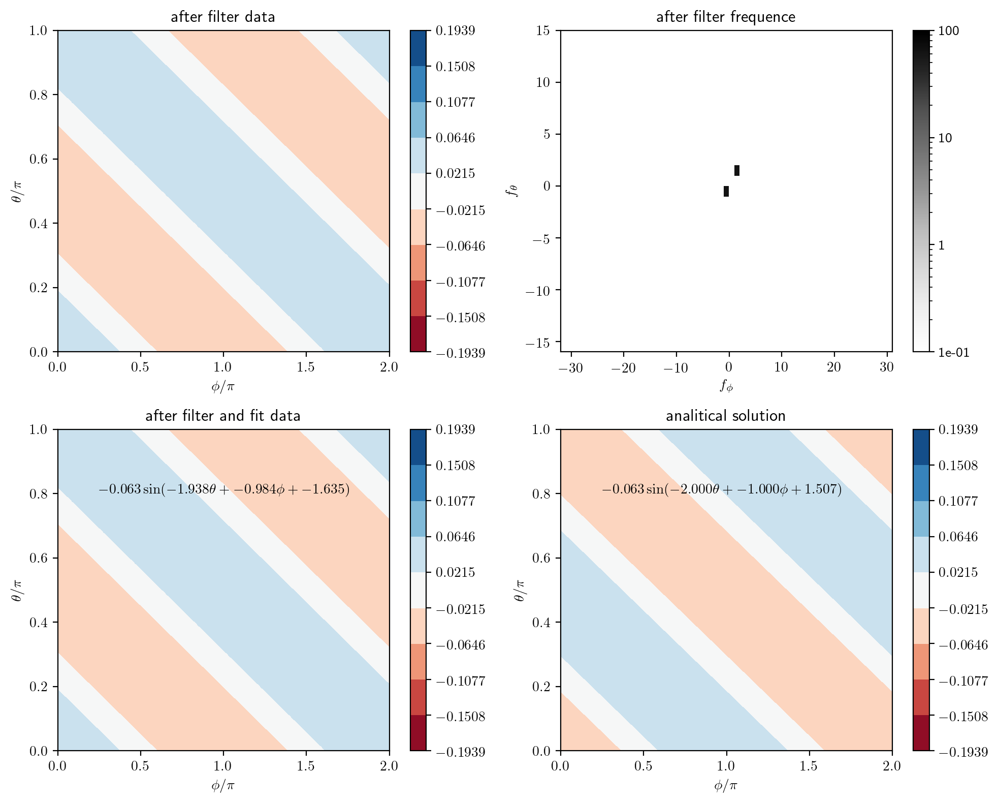

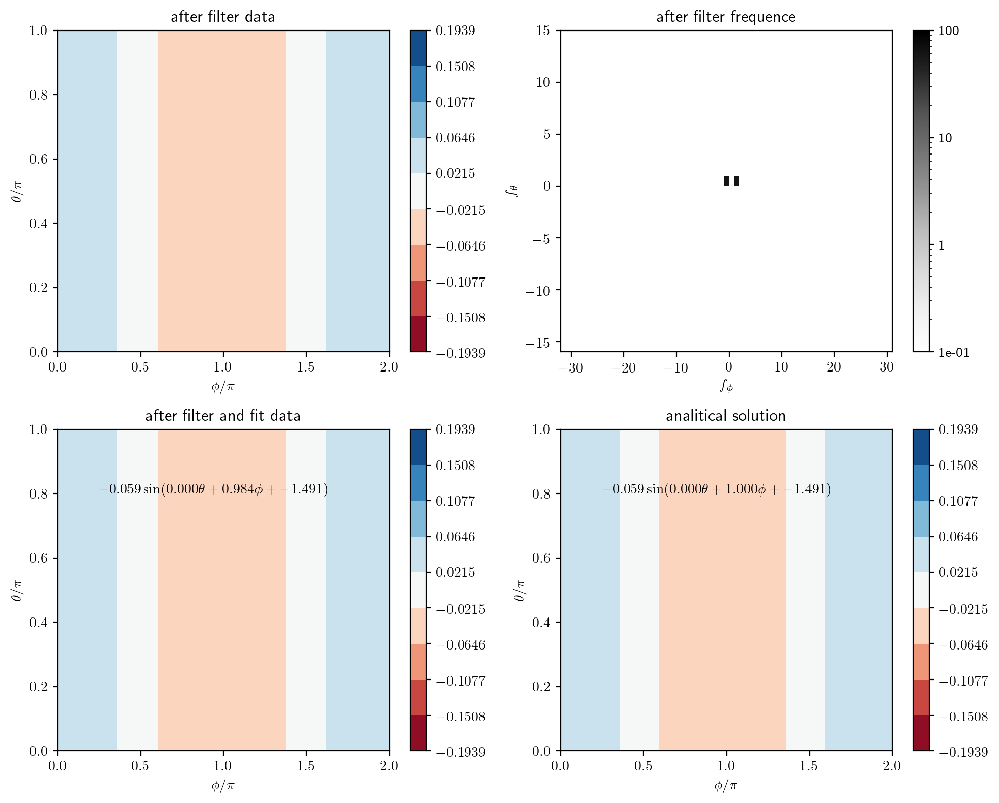

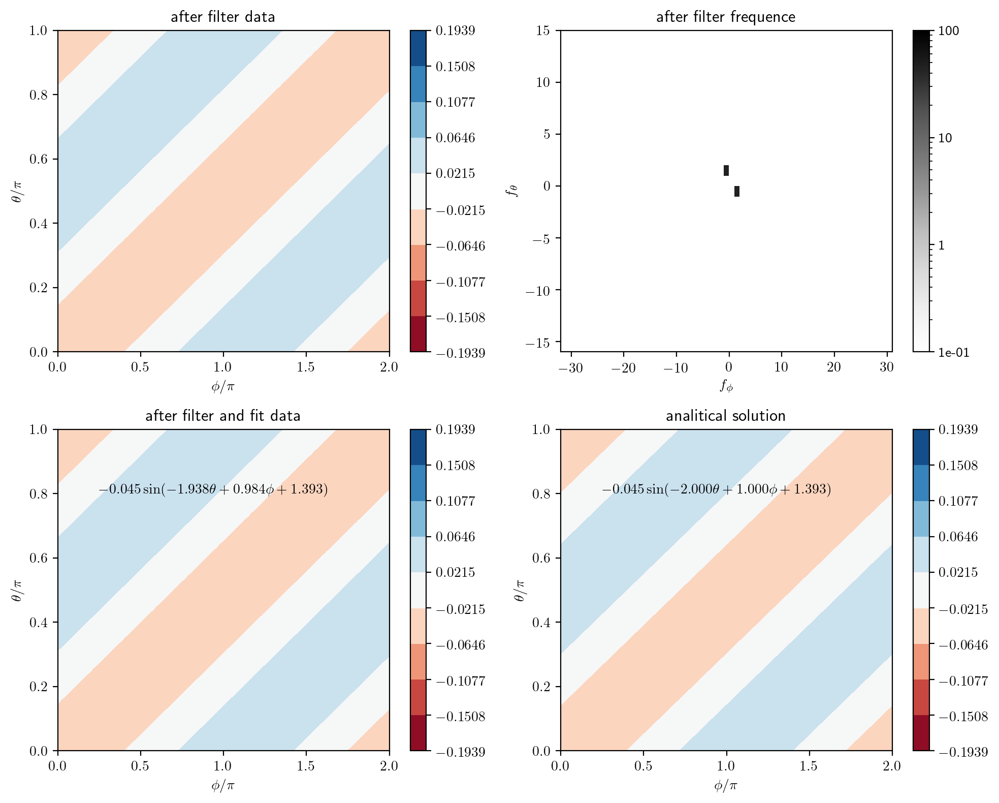

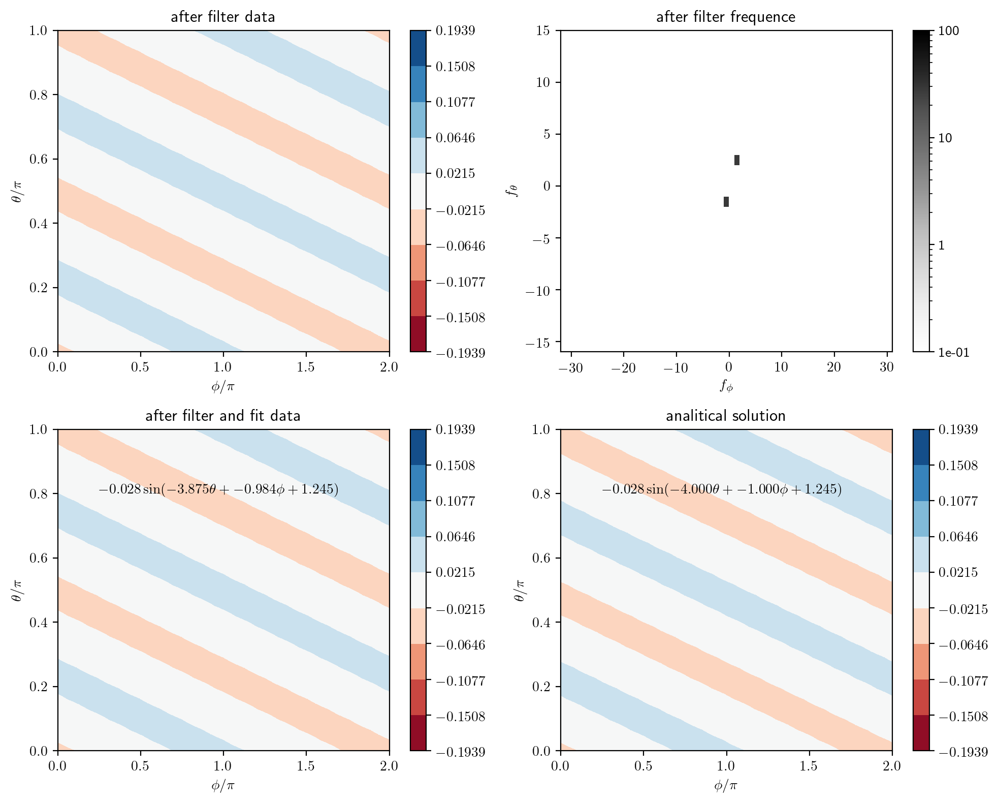

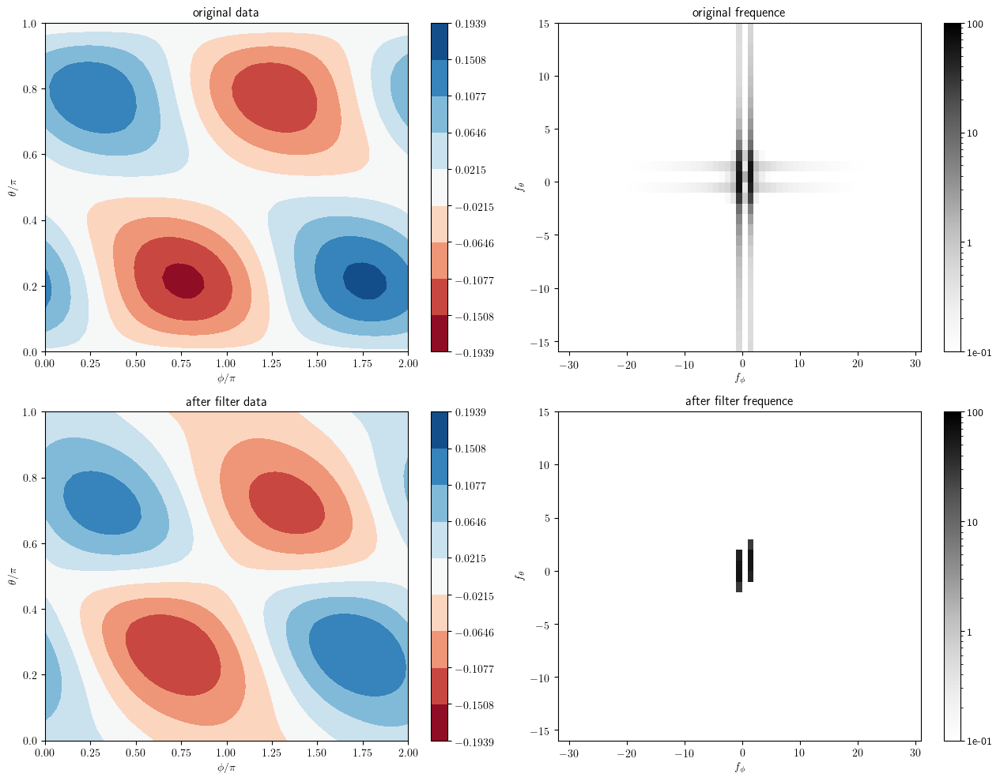

In [496]:
# 2D fft of Wx, Wy, Wz
fft_pickle = 'ecoC01B05_tao1_wm0'
use_uidx = 3 # 3: wx, 4: wy, 5: wz
use_idx_list = [[0, 1], [2, 3], [4, 5], [6, 7]]
# use_idx_list = [[0], [1, 2], [3, 4], [5, 6]]

# ((psi, ((theta, phi, ui))))
with open('%s.pickle' % fft_pickle, 'rb') as handle:
    pickle_data = pickle.load(handle)
ttheta, tphi = pickle_data[0][1][0][:2]
tpsi = np.array([ti[0] for ti in pickle_data])
tw = pickle_data[0][1][use_uidx][2].values

for use_idx in use_idx_list:
    if len(use_idx) == 1:
        tw_fft, tw2, tw_fft2 = do_fft_major(tw, use_idx)
        show_fft_major(tw, tw_fft, tw2, tw_fft2, ttheta, tphi)
    else:
        show_fft_fit(tw, use_idx, ttheta, tphi)

use_idx = np.hstack(use_idx_list)
tw_fft, tw2, tw_fft2 = do_fft_major(tw, use_idx)
show_fft_major(tw, tw_fft, tw2, tw_fft2, ttheta, tphi)

In [502]:
table_psi_data[5][2]

norm_phi,0.000000,0.099733,0.199466,0.299199,0.398932,0.498666,0.598399,0.698132,0.797865,0.897598,...,5.385587,5.485321,5.585054,5.684787,5.784520,5.884253,5.983986,6.083719,6.183452,6.283185
norm_theta,,,,,,,,,,,,,,,,,,,,,
0.000000,0.012721,0.012428,0.012011,0.011474,0.010823,0.010065,0.009206,0.008256,0.007224,0.006119,...,0.009744,0.010542,0.011235,0.011816,0.012280,0.012622,0.012839,0.012928,0.012889,0.012721
0.101342,0.041382,0.038731,0.035696,0.032307,0.028598,0.024606,0.020371,0.015934,0.011340,0.006635,...,0.044994,0.046471,0.047485,0.048026,0.048088,0.047672,0.046783,0.045428,0.043622,0.041382
0.202683,0.067839,0.062930,0.057395,0.051293,0.044683,0.037631,0.030209,0.022490,0.014550,0.006467,...,0.078162,0.080216,0.081470,0.081912,0.081538,0.080350,0.078363,0.075595,0.072075,0.067839
0.304025,0.090218,0.083242,0.075440,0.066894,0.057687,0.047912,0.037665,0.027050,0.016169,0.005133,...,0.107424,0.109871,0.111221,0.111459,0.110582,0.108603,0.105540,0.101425,0.096300,0.090218
0.405367,0.107028,0.098269,0.088539,0.077935,0.066564,0.054537,0.041975,0.029003,0.015749,0.002345,...,0.131204,0.133801,0.135058,0.134962,0.133512,0.130728,0.126639,0.121287,0.114727,0.107028
0.506708,0.117257,0.107079,0.095843,0.083664,0.070660,0.056962,0.042708,0.028037,0.013096,-0.001970,...,0.148302,0.150773,0.151731,0.151165,0.149082,0.145505,0.140475,0.134043,0.126276,0.117257
0.608050,0.120452,0.109276,0.097023,0.083814,0.069782,0.055065,0.039811,0.024171,0.008298,-0.007651,...,0.157979,0.160050,0.160514,0.159365,0.156613,0.152289,0.146442,0.139134,0.130439,0.120452
0.709392,0.116765,0.105052,0.092306,0.078651,0.064226,0.049172,0.033638,0.017780,0.001755,-0.014284,...,0.160005,0.161441,0.161256,0.159450,0.156039,0.151058,0.144563,0.136626,0.127326,0.116765
0.810734,0.106930,0.095162,0.082460,0.068946,0.054756,0.040036,0.024926,0.009576,-0.005860,-0.021229,...,0.154664,0.155300,0.154375,0.151899,0.147894,0.142399,0.135473,0.127193,0.117644,0.106930


use frequence 12.322282+186.549931i at (0, 62)
use frequence 12.322282+-186.549931i at (0, 2)
absolute abs of imag part is 1.3877787807814457e-17
use frequence 7.224083+-139.006877i at (0, 2)
use frequence 7.224083+139.006877i at (0, 62)
absolute abs of imag part is 6.938893903907228e-18
use frequence -0.003642+-82.446577i at (1, 62)
use frequence -0.003642+82.446577i at (31, 2)
absolute abs of imag part is 8.013377570109035e-18


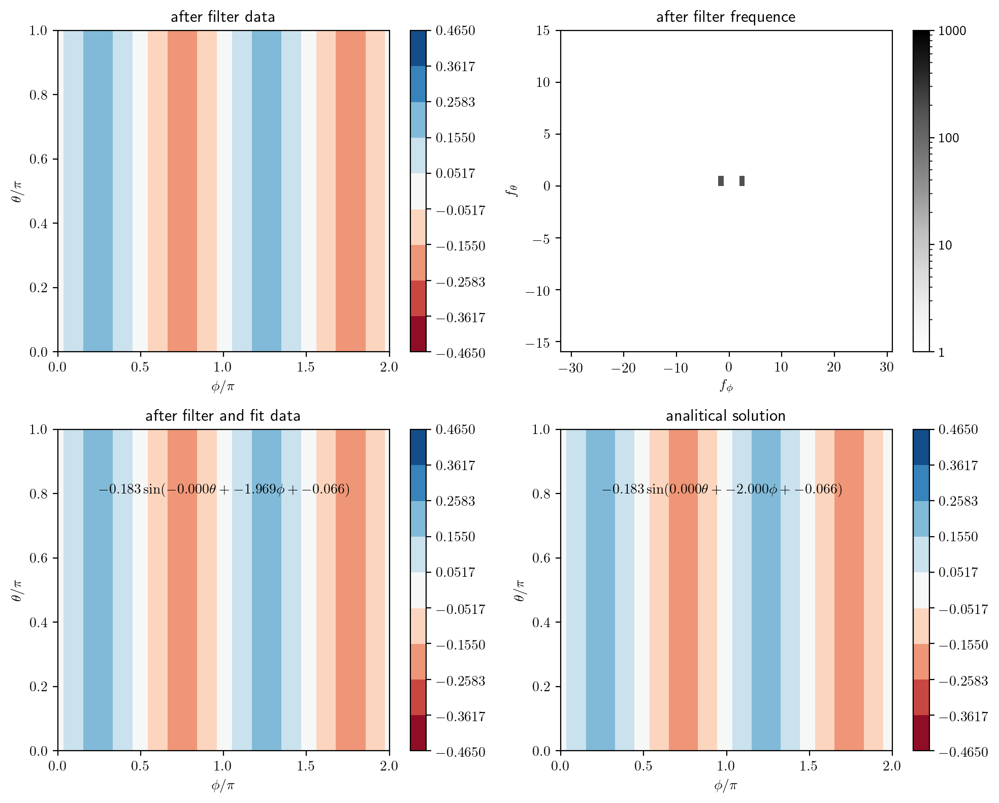

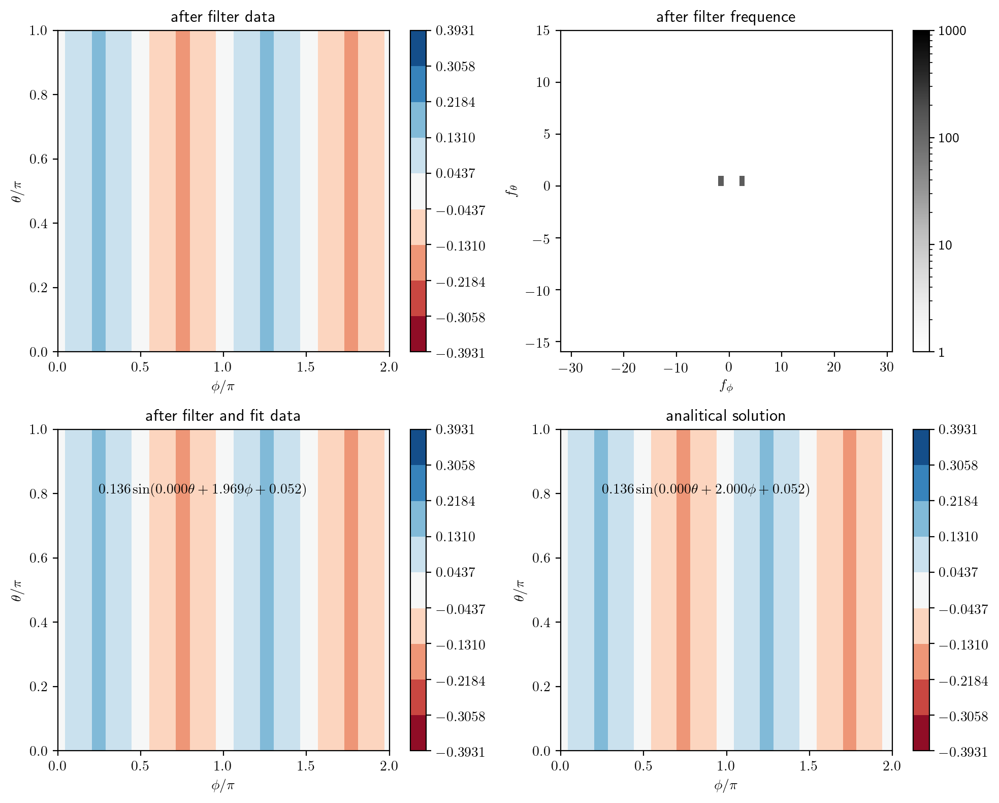

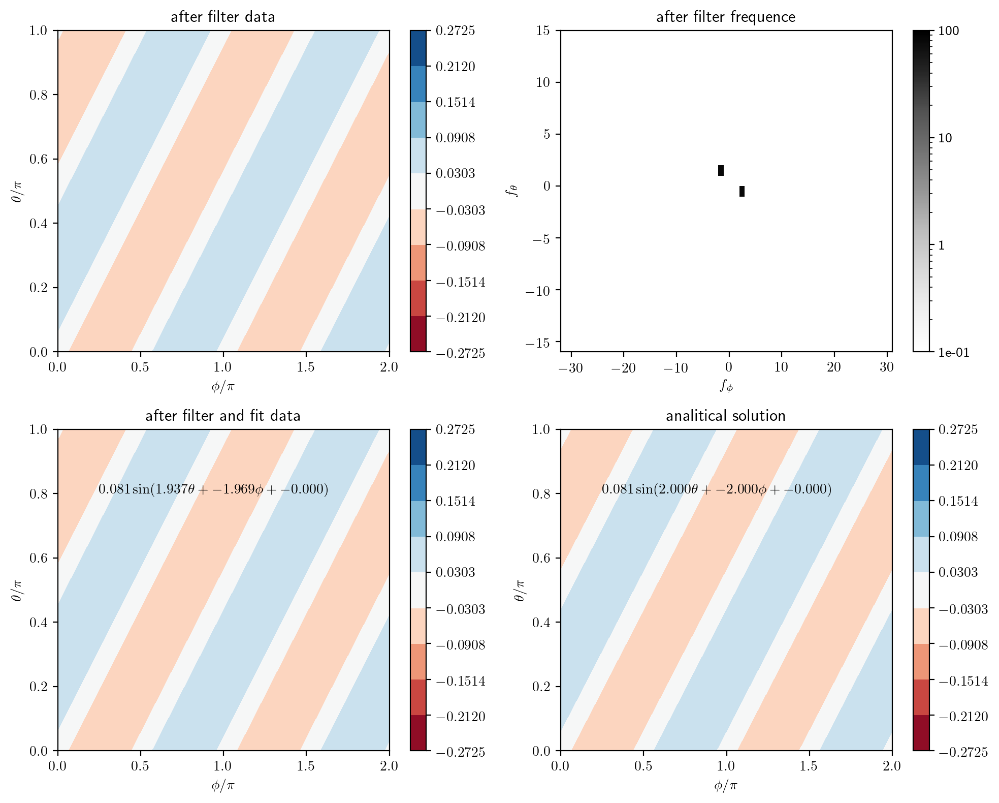

In [504]:
# 2D fft of Wx, Wy, Wz, investigate Amp and \alpha as function of \psi
fft_pickle = 'ecoC01B05_tao1_wm0'
use_uidx = 3 # 3: wx, 4: wy, 5: wz
use_idx = [0, 1]

# ((psi, ((theta, phi, ui))))
with open('%s.pickle' % fft_pickle, 'rb') as handle:
    pickle_data = pickle.load(handle)
ttheta, tphi = pickle_data[0][1][0][:2]
tpsi = np.array([ti[0] for ti in pickle_data])

for tpsi, table_psi_data in pickle_data[:3]:
    tw = table_psi_data[use_uidx][2].values
    show_fft_fit(tw, use_idx, ttheta, tphi)

In [338]:
print('%f' % tw_fft[10, 10])

-0.000514


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: ComplexWarning: Casting complex values to real discards the imaginary part
  """Entry point for launching an IPython kernel.
